<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
# !pip install ydata_profiling

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import re
import seaborn as sns
from ydata_profiling import ProfileReport

import phik

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import clone

import plotly.express as px
import plotly.graph_objects as go

import warnings  
warnings.filterwarnings("ignore")  

from time import time


random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [4]:
# п. 1, п. 2

def check_nan_dup(df):
    nan_col = df.isna().sum(axis=0)
    nan_col = nan_col[nan_col > 0]

    n_dup = df.duplicated().sum()
    if nan_col.empty:
        print("В датасете нет пропусков")

    else:
        for i in range(len(nan_col)):
            print(f"В столбце {nan_col.index[i]} присуствует {nan_col.values[i]} пропуска")
    print("--------------------------------------------")
    print(f"В датасете {n_dup} дубликатов")
    print("============================================")

check_nan_dup(df_train)
check_nan_dup(df_test)

В столбце mileage присуствует 202 пропуска
В столбце engine присуствует 202 пропуска
В столбце max_power присуствует 196 пропуска
В столбце torque присуствует 203 пропуска
В столбце seats присуствует 202 пропуска
--------------------------------------------
В датасете 985 дубликатов
В столбце mileage присуствует 19 пропуска
В столбце engine присуствует 19 пропуска
В столбце max_power присуствует 19 пропуска
В столбце torque присуствует 19 пропуска
В столбце seats присуствует 19 пропуска
--------------------------------------------
В датасете 62 дубликатов


In [5]:
# п. 3

profile_train = ProfileReport(df_train, title="Profiling Report")
profile_test = ProfileReport(df_test, title="Profiling Report")

In [6]:
profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 128.06it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 128902.96it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ваш ответ здесь.**

__Вывод:__ расчет дубликатов у `pandas` и `ydata-profilling` различаются((. В данных присуствуют категориальные переменные, которые для работы придется обработать. В предполагаемые числовые переменные попало некоторое число текстовых ячеек, которые тоже нужно будет обработать. В данных присуствуют пропуски и дубликаты. С точки зрения корреляции, то можно допустить, что существует линейная отрицательная взаимосвязь цены и пробега, что не противоречит здравому смыслу кроме продажи дорогих ретро-автомобилей. 

Достаточно много пропущенных, количество дубликатов не так критично.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [8]:
# п. 1, 3
pd.set_option('display.float_format', '{:.2f}'.format) # отключаем экспоненциальную запись для красоты

display(df_train.describe(include=['number']))
display(df_test.describe(include=['number']))

,year,selling_price,km_driven,seats
count,6999.00,6999.00,6999.00,6797.00
mean,2013.82,639515.20,69584.62,5.42
std,4.05,808941.91,57724.00,0.97
min,1983.00,29999.00,1.00,2.00
25%,2011.00,254999.00,35000.00,5.00
50%,2015.00,450000.00,60000.00,5.00
75%,2017.00,675000.00,97000.00,5.00
max,2020.00,10000000.00,2360457.00,14.00


,year,selling_price,km_driven,seats
count,1000.00,1000.00,1000.00,981.00
mean,2013.68,617901.04,71393.34,5.41
std,4.01,758553.86,48486.22,0.92
min,1995.00,31000.00,1303.00,4.00
25%,2011.00,250000.00,37000.00,5.00
50%,2014.00,434999.00,61500.00,5.00
75%,2017.00,670000.00,100000.00,5.00
max,2020.00,6000000.00,375000.00,9.00


__Выводы для числовых признаков__: между обучающей и тестовой выборками нет существенных различий, средние значения и медиана приблизительно равны, однако стандартное отклонение для `selling_price` и `km_driven` великовато, что может говорить о наличии каких-то выбросов (но не факт! надо проверять непосредственно на поиск этих выбросов). Существенное различие для `selling_price` уже в целом подтверждает высказанные предположения о наличии выбросов. Вероятнее всего это какие-то дорогостоящие автомобили депутатов. В обучающую выборку попали объекты с бОльшим размахом, охватывая бОльшую выборку. Вероятнее всего, разбиение на выборки сделано корректно

In [9]:
display(df_train.describe(include=['object']))

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [10]:
# п. 2

display(df_train.describe(include=['object']))
display(df_test.describe(include=['object']))

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


__Вывод для категориальных признаков:__ обучающая выборка и в этом случае охватывает бОльше уникальных значений. Возможно, тестовая выборка окажется слишком простов. Но для этого умы человечества уже придумали кросс-валидацию

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [11]:
# п. 1

dup_mask = df_train.drop('selling_price', axis=1).duplicated()
if dup_mask.sum() > 0:
    print(f"В выборке присуствуют дубликаты в размере {dup_mask.sum()}")
else:
    print("В выборке нет дубликатов")

В выборке присуствуют дубликаты в размере 1159


In [12]:
# п. 2

df_train[dup_mask]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.00
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.00
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.00
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.00
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.00
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.00
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.00
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.00


In [13]:
# п. 3

df_train = df_train[~dup_mask]

In [14]:
# п. 4

df_train.reset_index(inplace=True, drop=True)

In [15]:
assert df_train.shape == (5840, 13)

__Рассуждалка (п. 5):__ на экономе проект по Анализу данных был как раз по автомобилям, где было очень много дублей, которые было тяжело найти в автоматическом режиме, многие объекты отсматривались вручную по ссылкам на объявления.

Неоторые из способов автоматизации, который сейчас пришли на ум: изменение регистра и исключение знаков препинания в описании объявления; пропущенные значения в строке считать как схожие; оставить некоторый зазор в числовых признаках (+- 5% от заявленного); использовать модели МО, например, KNN, чтобы найти "похожесть"

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [16]:
def split_x(x, format=float):
    try:
        return format(x)
    except:
        data = x.split(' ')[0]
        try:
            return format(data)
        except:
            return np.nan
    
def astype_numeric(df, col_names, format):
    if isinstance(col_names, list):
        for col_name in col_names:
            df[col_name] = df[col_name].apply(split_x, format=format)
    else:
        df[col_names] = df[col_names].apply(split_x, format=format)

In [17]:
astype_numeric(df_train, ['mileage', 'engine', 'max_power'], float)
astype_numeric(df_test, ['mileage', 'engine', 'max_power'], float)

__Рассуждалка:__ в столбце `torque` у нас очень разношерстные данные. Во-первых, deepseak сказал, что для крутящего момента (torque) существует две шкалы измерения: 
- Nm - Ньютон-метры (международная система)
- kgm - Килограмм-сила-метры (1 kgm = 9.80665 Nm)
Буду приводить все к международному стандарту (nm)

Во-вторых, для `max_torque_rpm` в некоторых случаях указывается интервал, так как в название столбца заложено слово "max" буду использовать верхнее значение

In [18]:
def split_torque(x):
    if isinstance(x, str):
        x = x.lower()
        if '+/-' in x:
            x_list = x.split('@ ')
            torque = x_list[0]
            if 'nm' in torque:
                torque = float(torque.split('nm')[0])
            max_torque = x_list[1].split('+/-')[0]
            max_torque = int(max_torque.replace(',', ''))
        elif 'nm@ ' in x:
            x_list = x.split('nm@ ')
            torque = float(x_list[0])
            max_torque = x_list[1][:-3]
            if '-' in max_torque:
                max_torque = max_torque.split('-')[-1]
            elif '~' in max_torque:
                max_torque = max_torque.split('~')[-1]
            max_torque = int(max_torque.replace(',', ''))
        elif '(kgm@ rpm)' in x:
            x_list = x.split('@ ')
            torque = float(x_list[0]) * 9.80665
            max_torque = x_list[1].split('(')[0]
            if '-' in max_torque:
                max_torque = max_torque.split('-')[-1]
            max_torque = int(max_torque.replace(',', ''))
        elif 'kgm@ ' in x:
            x_list = x.split('kgm@ ')
            torque = float(x_list[0]) * 9.80665
            max_torque = x_list[1][:-3]
            if '-' in max_torque:
                max_torque = int(max_torque.split('-')[-1])
        elif 'kgm at ' in x:
            x_list = x.split(' kgm at ')
            torque = float(x_list[0]) * 9.80665
            max_torque = x_list[1].split('-')[-1][:-3]
            max_torque = int(max_torque.replace(',', ''))
        elif 'nm at ' in x:
            x_list = x.split('nm at ')
            torque = float(x_list[0])
            max_torque = x_list[1].split('-')[-1].split('r')[0]
            max_torque = int(max_torque.replace(',', ''))
        elif '@ ' in x:
            x_list = x.split('@ ')
            torque = x_list[0]
            if 'nm' in torque:
                torque = torque.split('nm')[0]
            if '(' in torque:
                torque = torque.split('(')[0]
            torque = float(torque)
            max_torque = x_list[1][:-3]
            if '-' in max_torque:
                max_torque = int(max_torque.split('-')[-1])
        elif 'nm' in x:
            x_list = x.split('nm')
            torque = float(x_list[0])
            max_torque = np.nan
        elif ' / ' in x:
            x_list = x.split(' / ')
            torque = float(x_list[0])
            max_torque = float(x_list[1])
    else:
        torque, max_torque = np.nan, np.nan

    return float(torque), float(max_torque)

def apply_split_torque(df):
    torque_values, rpm_values = zip(*df['torque'].apply(split_torque))
    df['torque'] = torque_values
    df['max_torque_rpm'] = rpm_values

In [19]:
apply_split_torque(df_train)
apply_split_torque(df_test)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






__Напомним себе__ в каких столбцах у нас есть пропуски

In [20]:
display(df_train.isna().sum())
display(df_test.isna().sum())

name                0
year                0
selling_price       0
km_driven           0
fuel                0
seller_type         0
transmission        0
owner               0
mileage           186
engine            186
max_power         184
torque            187
seats             186
max_torque_rpm    191
dtype: int64

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage           19
engine            19
max_power         19
torque            19
seats             19
max_torque_rpm    23
dtype: int64

In [21]:
for col_name in df_train.columns[df_train.isna().sum() > 0]:
    col_mean = df_train[col_name].median()

    idx_train = df_train[col_name].isna()
    idx_test = df_test[col_name].isna()

    df_train.loc[idx_train, col_name] = col_mean
    df_test.loc[idx_test, col_name] = col_mean

__Обоснование, рассуждение и выбор верного утверждения:__ 
1. Мы применяем медиану в связи с наличием выбросов в данных, что было указано в выводах выше. Мы могли бы применить и среднее, но оно применяется в случае если выбросы отсутствуют, так как среднее "перетянет" выборку в свою сторону (то есть если в выборке присуствуют космические корабли за все деньги мира), то стандартным автомобилям мы также "припишем" около вседенежную мира стоимость автомобиля. 
2. Мы используем мединное значение обучающей выборки и для train и для test, так как в таком случае модель не получит "скрытую информацию" о тестовой выборке при обучении. С другой стороны мы иммитируем реальные условия, когда мы не видим всей тестовой выборки

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [22]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

__Ответ:__ количество посадочных мест все-таки ограничено какими-то разумными цифрами, которые, к тому же, дискретны. Количество посадочных мест скорее указывает на тип автомобиля (8 - микроавтобус, 2 - спорткар и тд)

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [23]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00
mean,2013.43,522960.09,73952.24,19.43,1429.45,87.91,175.36,5.43,3043.75
std,4.10,535432.00,60071.14,3.99,485.66,31.64,107.15,0.98,915.16
min,1983.00,29999.00,1.00,0.00,624.00,0.00,47.07,2.00,2.00
25%,2011.00,250000.00,39000.00,16.95,1197.00,68.00,111.80,5.00,2250.00
50%,2014.00,405000.00,70000.00,19.37,1248.00,81.86,160.00,5.00,3000.00
75%,2017.00,640000.00,100000.00,22.30,1498.00,99.00,200.06,5.00,4000.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,1863.26,14.00,21800.00


__Ответ:__ Да, такое могло произойти для статистик, основанных на среднем числе, в случае наличия выбросов в данных. При выбросах, медиана "перетянет" ближе к середине среднее, что приведет к сдвигу среднего и дисперсии

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

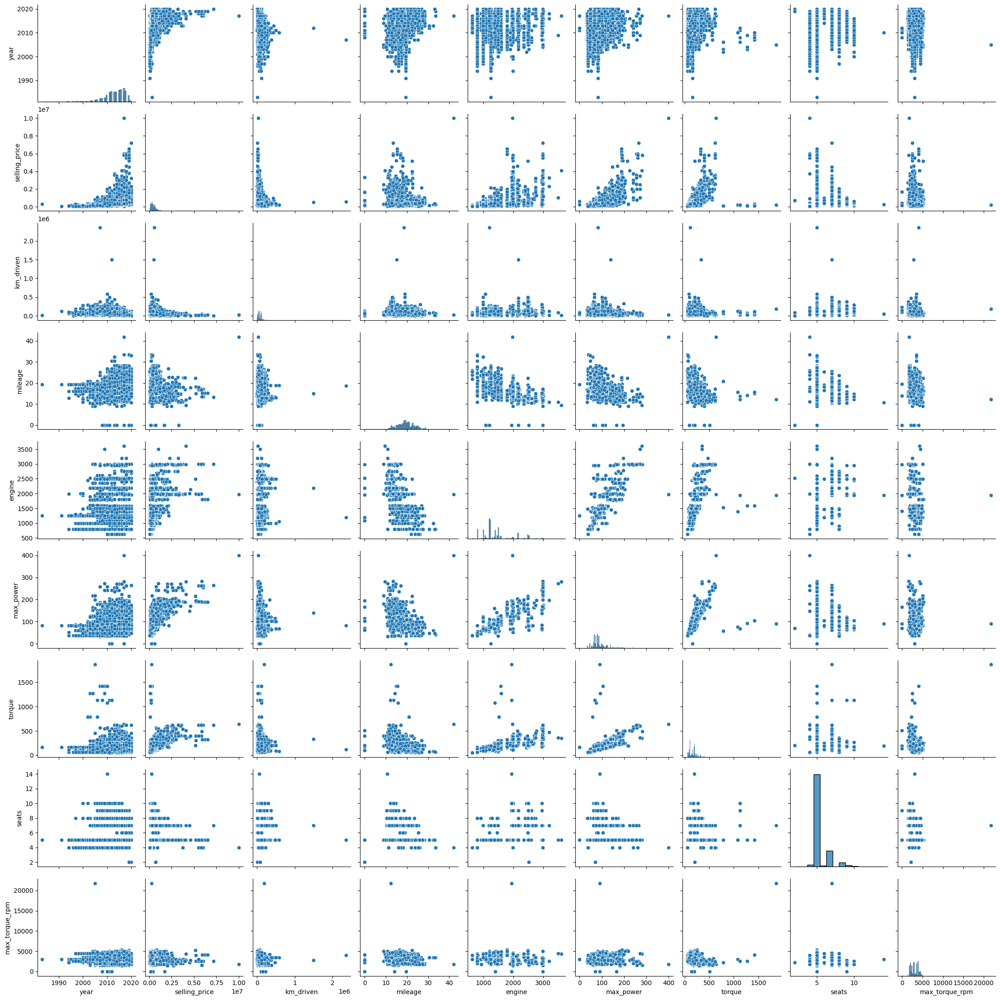

In [24]:
%matplotlib inline
sns.pairplot(df_train.select_dtypes(include=['number']));

__Ответы:__
1. По некоторым графикам можно действительно определить связь, например, 
- Чем старше автомобиль, тем дешевле он (связь похожа на экспоненциальную)
- Пробег значительно удешевляет автомобиль (связь похожа на логарифмическую)
- Автомобили с бОльшим объемом двигателя более дорогие (можно сказать, что связь линейная)
- С max_power скорее тоже линейная связь

2. Да, если между признаками существует линейная связь, то scatter должны выстраиваться в линию, например, как между 
- torque и max_power
- torque и engine
- max_power и engine,
- selling_price и torque
- selling_price и max_power

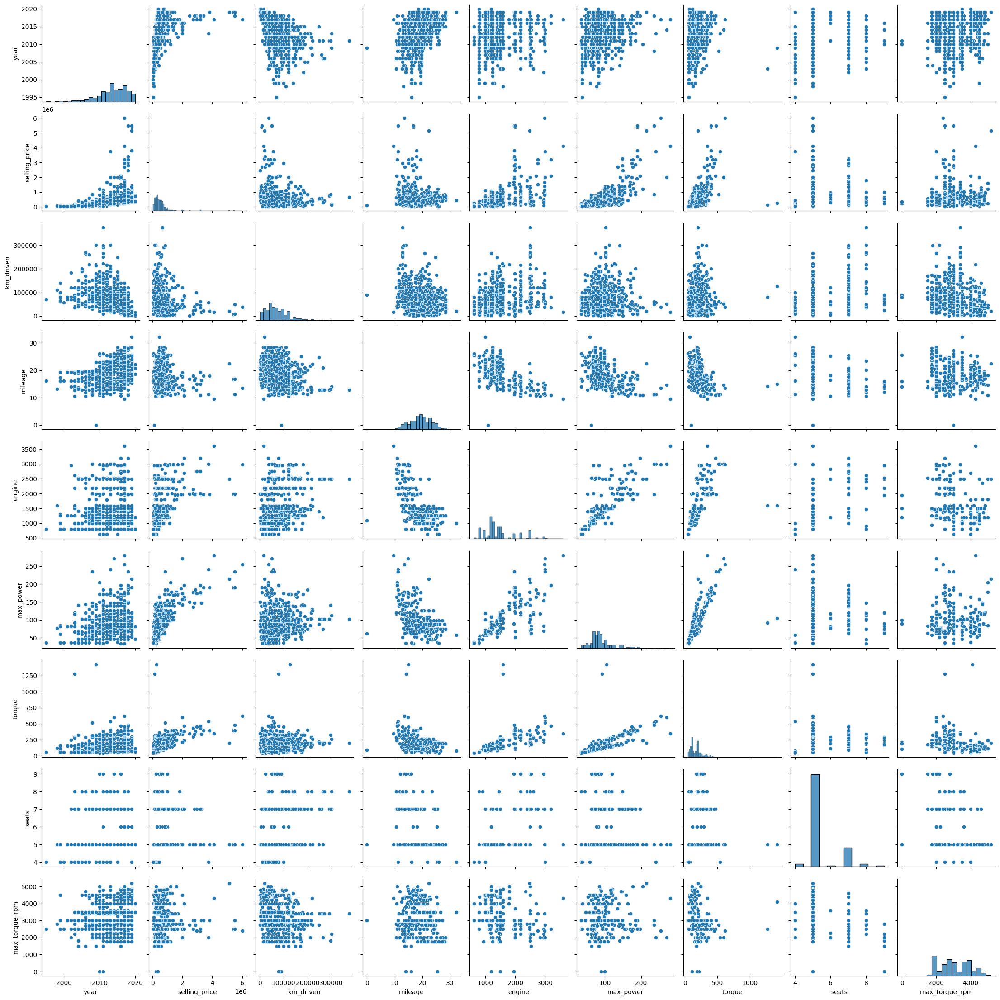

In [59]:
sns.pairplot(df_test.select_dtypes(include=['number']));

__Ответ__ графики распределений оказались довольно похожими, если судить в таком масштабе графиков, большое количество вопросов вызывают выбросы в тренировочной и тестовой выборках для признаков tonque и max_power, однако большую обеспокоенность вызывают выбросы и у других признаков обучающей выорки. Например, max_torque_rpm, который довел до седины еще на этапе "вычлинения его", однако, этот выброс не связан с моей работой, ниже представлено доказательство

In [36]:
check_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
check_train[check_train['name'] == df_train.loc[df_train.max_torque_rpm.argmax()]['name']]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
4633,Tata Sumo EX TC,2005,225000,188000,Diesel,Individual,Manual,First Owner,12.3 kmpl,1948 CC,90 bhp,"190@ 21,800(kgm@ rpm)",7.00


### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

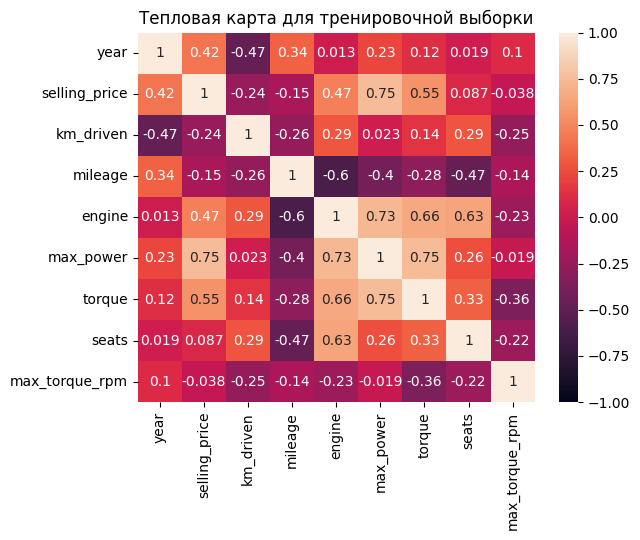

In [43]:
corr = df_test.select_dtypes(include=['number']).corr()
sns.heatmap(corr, vmin=-1, annot=True)
plt.title('Тепловая карта для тренировочной выборки');

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

In [78]:
def filter_corr_pair(x):
    unique_pairs = set(tuple(sorted(pair)) for pair in x)
    return [tuple(pair) for pair in unique_pairs]

In [79]:
# п. 1

min_abs_corr = corr.abs().min().min()
mask = corr.abs() == min_abs_corr
min_corr_pairs = [(corr.columns[i], corr.index[j]) for i, j in zip(*np.where(mask))]

filter_corr_pair(min_corr_pairs)

[('engine', 'year')]

In [83]:
# п. 2

mask = corr.abs() - np.eye(corr.shape[0]) >= 0.7
big_corr_pairs = [(corr.columns[i], corr.index[j]) for i, j in zip(*np.where(mask))]

filter_corr_pair(big_corr_pairs)

[('max_power', 'torque'),
 ('engine', 'max_power'),
 ('max_power', 'selling_price')]

__Ответы:__ 
1. Наименее скоррелированы между собой - engine и year
2. Довольно сильную положительную корреляцию будем считать >= 0.7 по модулю, а это `max_power и torque`, `engine и max_power`, `max_power и selling_price`, мой зоркий глаз меня подвел на графиках, угадал 2/5
3. В общем и целом, это так: чем старше автомобиль, тем больше пробег, но наблюдается не очень сильная линейная взаимосвязь (корреляция -0.47), вероятнее всего, существуют какие-то ретро-автомобили, которым сменили мотор и, не смотря, на то, что на нем еще гонял Генри Форд, пробег будет небольшой из-за ремонта, с другой стороны, могут быть автомобили Я.Go, которые за полгода могли 8 раз проехать всю землю. 
4. По умолчанию используется корреляция Пирсона, также можно использовать Спирмана и Кендалла

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [135]:
def corr_spearman(df):
    df_num = df.select_dtypes(include=['number'])
    data = df_num.to_numpy()
    ranks = data.argsort(axis=0).argsort(axis=0)
    corr = np.zeros((ranks.shape[1], ranks.shape[1]))

    n = ranks.shape[0]
    for col_ind in range(ranks.shape[1]):
        for col_ind2 in range(col_ind, ranks.shape[1]):
            col1 = ranks[:, col_ind]
            col2 = ranks[:, col_ind2]
            d = col1 - col2
            d2 = d ** 2
            ro = 1 - ((6 * d2.sum()) / (n * (n ** 2 - 1)))
            corr[col_ind, col_ind2] = ro
    corr = corr + corr.T - np.eye(ranks.shape[1])
    corr = pd.DataFrame(corr, index=df_num.columns, columns=df_num.columns)

    return corr

In [137]:
display(corr_spearman(df_train))
display(df_train.select_dtypes(include=['number']).corr('spearman'))

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.00,0.71,-0.57,0.34,-0.03,0.17,0.10,0.05,0.07
selling_price,0.71,1.00,-0.30,0.03,0.46,0.61,0.58,0.22,-0.13
km_driven,-0.57,-0.30,1.00,-0.20,0.30,0.04,0.24,0.11,-0.32
mileage,0.34,0.03,-0.20,1.00,-0.43,-0.31,-0.16,-0.31,-0.18
engine,-0.03,0.46,0.30,-0.43,1.00,0.71,0.84,0.36,-0.37
max_power,0.17,0.61,0.04,-0.31,0.71,1.00,0.78,0.20,-0.02
torque,0.10,0.58,0.24,-0.16,0.84,0.78,1.00,0.29,-0.52
seats,0.05,0.22,0.11,-0.31,0.36,0.20,0.29,1.00,-0.13
max_torque_rpm,0.07,-0.13,-0.32,-0.18,-0.37,-0.02,-0.52,-0.13,1.00


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.00,0.71,-0.57,0.35,-0.04,0.17,0.10,0.05,0.08
selling_price,0.71,1.00,-0.30,0.03,0.46,0.61,0.58,0.32,-0.13
km_driven,-0.57,-0.30,1.00,-0.20,0.30,0.04,0.24,0.20,-0.32
mileage,0.35,0.03,-0.20,1.00,-0.43,-0.31,-0.16,-0.44,-0.18
engine,-0.04,0.46,0.30,-0.43,1.00,0.71,0.84,0.53,-0.37
max_power,0.17,0.61,0.04,-0.31,0.71,1.00,0.78,0.30,-0.02
torque,0.10,0.58,0.24,-0.16,0.84,0.78,1.00,0.44,-0.53
seats,0.05,0.32,0.20,-0.44,0.53,0.30,0.44,1.00,-0.20
max_torque_rpm,0.08,-0.13,-0.32,-0.18,-0.37,-0.02,-0.53,-0.20,1.00


In [132]:
display(corr_spearman(df_test))
display(df_test.select_dtypes(include=['number']).corr('spearman'))

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.00,0.71,-0.59,0.31,0.01,0.21,0.15,-0.00,0.11
selling_price,0.71,1.00,-0.33,-0.02,0.52,0.67,0.63,0.20,-0.10
km_driven,-0.59,-0.33,1.00,-0.20,0.26,0.04,0.20,0.18,-0.30
mileage,0.31,-0.02,-0.20,1.00,-0.46,-0.35,-0.20,-0.32,-0.14
engine,0.01,0.52,0.26,-0.46,1.00,0.77,0.85,0.40,-0.34
max_power,0.21,0.67,0.04,-0.35,0.77,1.00,0.82,0.25,-0.04
torque,0.15,0.63,0.20,-0.20,0.85,0.82,1.00,0.33,-0.49
seats,-0.00,0.20,0.18,-0.32,0.40,0.25,0.33,1.00,-0.14
max_torque_rpm,0.11,-0.10,-0.30,-0.14,-0.34,-0.04,-0.49,-0.14,1.00


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.00,0.71,-0.60,0.32,0.02,0.21,0.16,0.03,0.11
selling_price,0.71,1.00,-0.33,-0.02,0.52,0.67,0.63,0.30,-0.10
km_driven,-0.60,-0.33,1.00,-0.20,0.26,0.05,0.20,0.24,-0.30
mileage,0.32,-0.02,-0.20,1.00,-0.46,-0.35,-0.20,-0.45,-0.14
engine,0.02,0.52,0.26,-0.46,1.00,0.77,0.85,0.54,-0.35
max_power,0.21,0.67,0.05,-0.35,0.77,1.00,0.82,0.34,-0.05
torque,0.16,0.63,0.20,-0.20,0.85,0.82,1.00,0.46,-0.50
seats,0.03,0.30,0.24,-0.45,0.54,0.34,0.46,1.00,-0.20
max_torque_rpm,0.11,-0.10,-0.30,-0.14,-0.35,-0.05,-0.50,-0.20,1.00


__Вывод:__ в расчете корреляции в ручном и "коробочковом" исполнении существует незначительная разница

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


<Axes: >

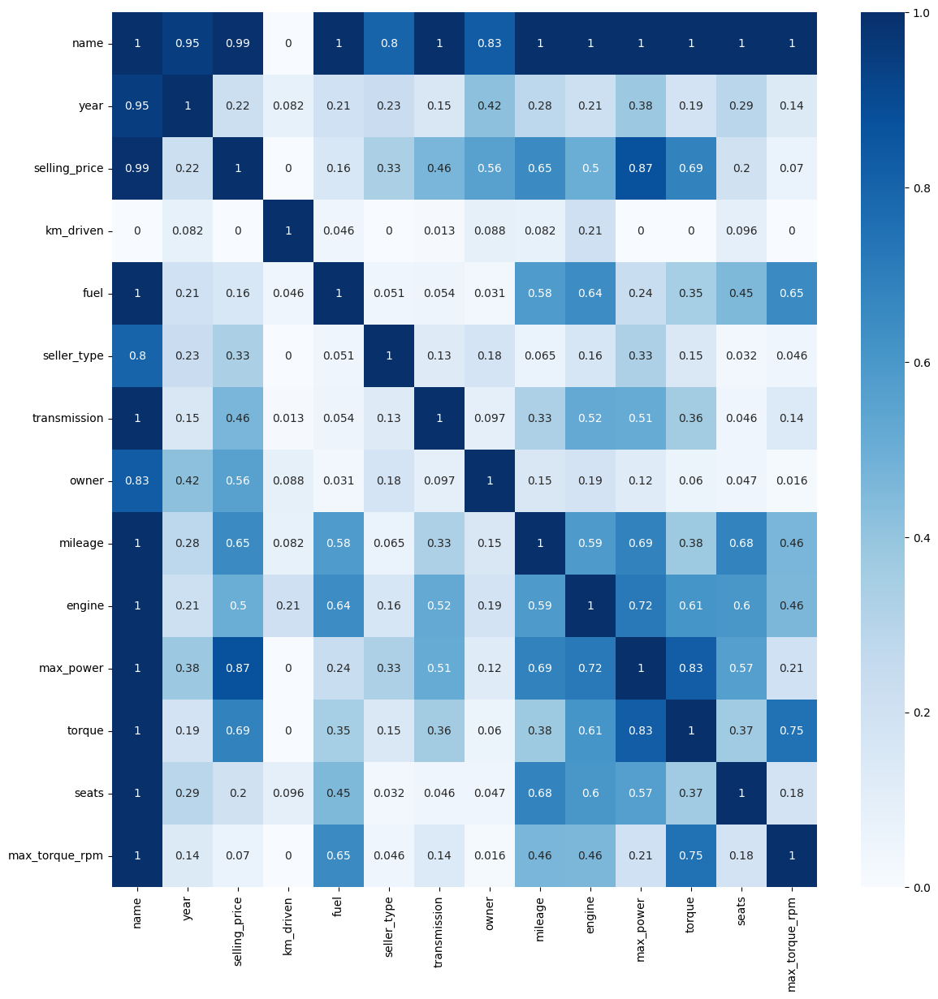

In [ ]:
plt.figure(figsize=(14,14))
ph = df_train.phik_matrix()
sns.heatmap(ph, cmap="Blues", annot=True)

__Интерпретация:__ довольно сложно пытаться интерпретировать корреляцию на графике, на котором есть сильная зависимость имени со всеми другими признаками... Из интересного есть зависимость цены и владельца автомобиля, что, вероятно, связано с тем, что салоны продают в основном новые автомобили, которые в цене дороже. В остальном, все важные выводы и инсайты были получены выше. По существу новшеств никаких не внеслось

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

__Преамбула:__ во многих выводах я писал о выбросах, но, учитывая, что следующее задание это уже построение моделей, работы с выбросами никакой не было(((. Тогда хотя бы посмотрим на ящики с усами и виолончель двух наиболее подозрительных признаков из задания с pairplot, а именно `selling_price` и `km_driven`

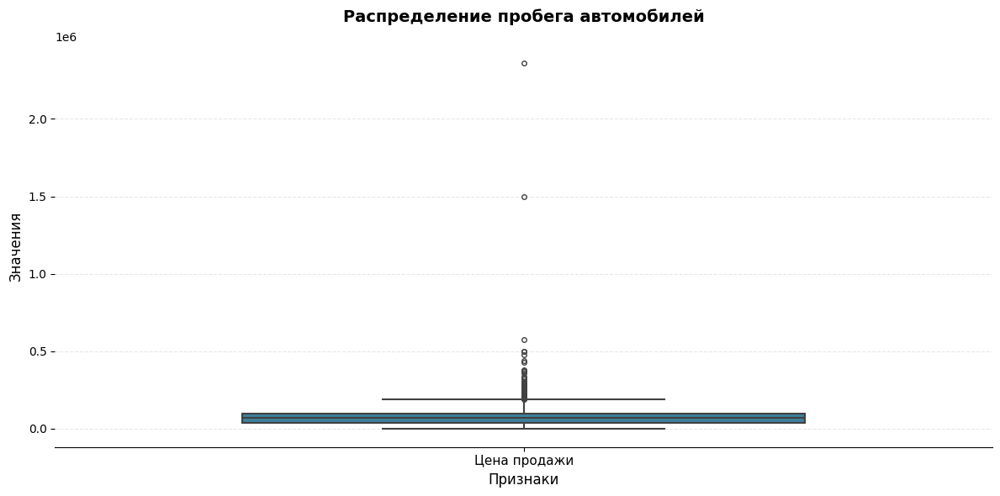

In [155]:
# DeepSeak, промт:
# sns.boxplot(df_train['km_driven'])
# plt.title('Ящики с усами');
# Сделай красиво

plt.figure(figsize=(12, 6))

sns.boxplot(data=df_train['km_driven'], 
            palette=['#2E86AB', '#A23B72'],
            width=0.6,
            linewidth=1.5,
            fliersize=4)

plt.title('Распределение пробега автомобилей', 
          fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Значения', fontsize=12)
plt.xlabel('Признаки', fontsize=12)
plt.xticks([0], ['Цена продажи'], fontsize=11)

plt.grid(axis='y', alpha=0.3, linestyle='--')

sns.despine(left=True)

plt.tight_layout()

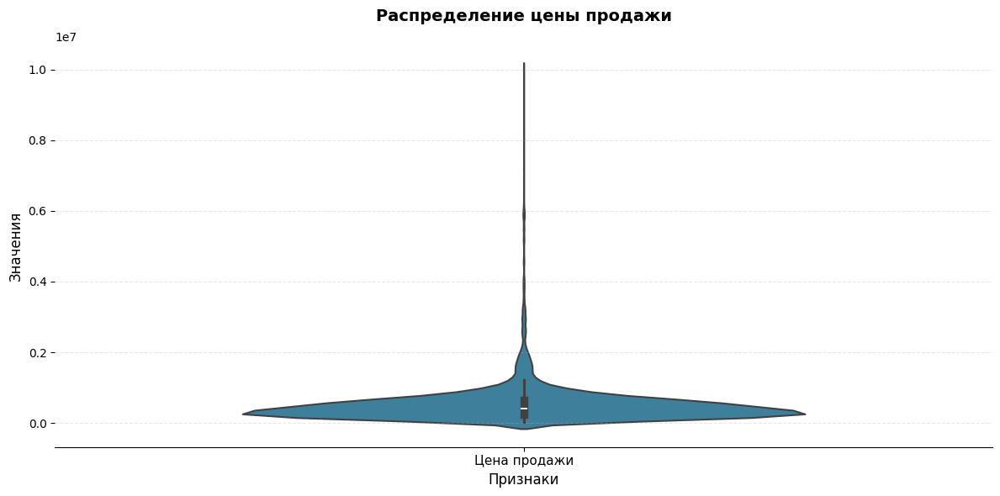

In [156]:
plt.figure(figsize=(12, 6))

sns.violinplot(data=df_train['selling_price'], 
            palette=['#2E86AB', '#A23B72'],
            width=0.6,
            linewidth=1.5)

plt.title('Распределение цены продажи', 
          fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Значения', fontsize=12)
plt.xlabel('Признаки', fontsize=12)
plt.xticks([0], ['Цена продажи'], fontsize=11)

plt.grid(axis='y', alpha=0.3, linestyle='--')

sns.despine(left=True)

plt.tight_layout()

__Выводы:__ Как и ожидалось, в данных присуствуют выбросы. На графике виолончели мы видим, что в данных затесались дорогостоящие машинки стоимостью более 10-ти млн, видна ассиметрия распределения, на рынке все-таки больше более дешевых автомобилей. Но для линейных моделей (я ожидаю, что именно такие будут в ДЗ) нет требований к нормальному распределению таргета (только его ошибки), поэтому и так сойдет (кроме выбросов...) 

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [173]:
num_columns = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']
df_train_numeric = df_train[num_columns]
df_test_numeric = df_test[num_columns]

In [174]:
y_train = df_train_numeric['selling_price']
X_train = df_train_numeric.drop('selling_price', axis=1)

1. year - год производства. Хотя этот признак содержит лишь 29 уникальных значений и формально мог бы рассматриваться как категориальный, его естественная упорядоченность и линейная интерпретируемость позволяют сохранить его в числовом формате. Разница между 2009 и 2007 годом имеет одинаковый физический смысл во всём диапазоне значений — это всегда разница в два года технологического развития, что напрямую влияет на цену и технические характеристики автомобиля # тут дипсик "причесал" мое скудное описание, почему год внесен в вещественные числа
2. mileage - расход топлива
3. engine - объем двигателя
4. max_power - максимальная мощность
5. torque - крутящий момент
6. seats - количество сидячих мест
7. max_torque_rpm - обороты двигателя
8. km_driven - пробег

Думаю, что оговорка о необходимости внесения других признаков не требуется, все остальные (кроме `seats`), очевидно, вещественные признаки

In [185]:
y_test = df_test_numeric['selling_price']
X_test = df_test_numeric.drop('selling_price', axis=1)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [188]:
all_metrics = pd.DataFrame(index=['R2', 'MSE'])

In [ ]:
model1 = LinearRegression()
model1.fit(X_train, y_train)
pred1 = model1.predict(X_test)

r2_model1 = r2_score(y_test, pred1)
mse_model1 = MSE(y_test, pred1)

all_metrics['Model1'] = [r2_model1, mse_model1]

In [196]:
all_metrics

,Model1
R2,0.60
MSE,229962033471.11


### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [ ]:
def manual_r2(y_true, y_pred):
    chisl = ((y_pred - y_true) ** 2).sum()           # сумма квадратов остатков (при / (n-1) - дисперсия ошибок)
    znam = ((y_true - y_true.mean()) ** 2).sum()     # общая сумма квадратов (при / (n-1) - дисперсия данных)
    otnosh = chisl / znam                            # доля необъясненной дисперсии
    r2 = 1 - otnosh                                  # доля объясненной дисперсии

    return r2

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
def manual_r2adj(y_true, y_pred, p):
    r2 = manual_r2(y_true, y_pred)                     # доля объясненной дисперсии
    otnosh = 1 - r2                                    # доля необъясненной дисперсии
    n = len(y_true)                                    # размер выборки
    penalty = (n - 1) / (n - p - 1)                    # штраф за сложность модели (при добавлении дополнительных признаков)
    r2adj = 1 - (1 - r2) * penalty
    return r2adj

__Объяснение:__ так как в расчете $\text{adjusted}-R^2$ используется число признаков, то и плясать нужно от этого:
1. Отбор признаков: добавление или удаление признаков до первого уменьшения метрики / выбор сложности модели (количество признаков)
2. Валидация двух моделей с разным числом признаков

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [ ]:
scaler = StandardScaler()
X_train_scal = scaler.fit_transform(X_train)
X_test_scal = scaler.transform(X_test)

model2 = LinearRegression()
model2.fit(X_train_scal, y_train)
pred2 = model2.predict(X_test_scal)

r2_model2 = r2_score(y_test, pred2)
mse_model2 = MSE(y_test, pred2)

all_metrics['Model2'] = [r2_model2, mse_model2]

all_metrics

,Model1,Model2
R2,0.60,0.60
MSE,229962033471.11,229962033471.11


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [221]:
params = model2.coef_
params = np.insert(params, 0, model2.intercept_)

columns = np.array(X_train.columns)
columns = np.insert(columns, 0, 'intercept')

print(f'{columns[abs(params).argmax()]}: {params[abs(params).argmax()]}')

intercept: 522960.0910958864


In [220]:
params = model2.coef_

columns = np.array(X_train.columns)

print(f'{columns[abs(params).argmax()]}: {params[abs(params).argmax()]}')

max_power: 328705.04174137017


__Ответ:__ неудивительно, что свободный коэффициент оказался больше всех, так как нам нужно на значительно большое количество у. е. сдвинуть нашу линию, однако из признаков наиболее информативной оказалась максимальная мощность, что тоже не противоречит здравому смыслу: за мощность, по большому счет, и должна быть оплата за автомобиль

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
model3 = Lasso(random_state=42)
model3.fit(X_train_scal, y_train)
pred3 = model3.predict(X_test_scal)

r2_model3 = r2_score(y_test, pred3)
mse_model3 = MSE(y_test, pred3)

all_metrics['Model3'] = [r2_model3, mse_model3]

all_metrics

,Model1,Model2,Model3
R2,0.60,0.60,0.60
MSE,229962033471.11,229962033471.11,229962763439.38


In [229]:
params = model3.coef_
params = np.insert(params, 0, model3.intercept_)

print(f"Количество зануленных параметров: {(params == 0).sum()}")

Количество зануленных параметров: 0


__Результат:__ 
1. Качество модели по метрике MSE стало хуже (MSE подросла), R2 остался неизменный
2. Ни один признак не был занулен, что может быть связано либо с важностью всех параметров модели в построении проноза, либо с малым коэффициентом резуляризации, либо что-то еще неведомое..

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [ ]:
param_grid = {'alpha': np.linspace(0, 100000, 500),                  # коэффициент регуляризации
              'max_iter': [5, 10, 20, 30, 50, 100, 300, 500]}        # максимальное число итераций 
                                                                        # (Lasso используется координатный спуск, max_iter ограничивает число шагов этого спуска)

gs = GridSearchCV(estimator=Lasso(random_state=42),
                  param_grid=param_grid,
                  cv=10,
                  scoring='neg_mean_squared_error',
                  verbose=1)
start_time = time()
gs.fit(X_train_scal, y_train)
proc_time = time() - start_time
pred4 = gs.predict(X_test_scal)

r2_model4 = r2_score(y_test, pred4)
mse_model4 = MSE(y_test, pred4)
all_metrics['GS_Lasso'] = [r2_model4, mse_model4]

Fitting 10 folds for each of 4000 candidates, totalling 40000 fits


In [285]:
models_counter = 1
for param in param_grid:
    models_counter *= len(param_grid[param])

print(f"Всего обучилось {models_counter * 10} моделей за {round(proc_time/60, 3)} минуты")

Всего обучилось 40000 моделей за 0.903 минуты


In [273]:
print(f"Наилучший коэффициент регуляризации: {gs.best_params_['alpha']}")

Наилучший коэффициент регуляризации: 4809.619238476954


In [ ]:
params = gs.best_estimator_.coef_
params = np.insert(params, 0, gs.best_estimator_.intercept_)

columns = np.array(X_train.columns)
columns = np.insert(columns, 0, 'intercept')

print(f"Модель занулила следующие признаки: {', '.join(columns[params == 0])}")

Модель занулила следующие признаки: mileage


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [297]:
# оставим такую же сетку, так как задачи выглядят как будто нужно сравнить количество моделей / время обучения...
                                                                       
gsEN = GridSearchCV(estimator=ElasticNet(random_state=42),
                  param_grid=param_grid,
                  cv=10,
                  scoring='neg_mean_squared_error',
                  verbose=1)
start_time = time()
gsEN.fit(X_train_scal, y_train)
proc_time = time() - start_time
pred5 = gsEN.predict(X_test_scal)

r2_model5 = r2_score(y_test, pred5)
mse_model5 = MSE(y_test, pred5)
all_metrics['GS_EN'] = [r2_model5, mse_model5]

Fitting 10 folds for each of 4000 candidates, totalling 40000 fits


In [298]:
all_metrics

,Model1,Model2,Model3,GS_Lasso,GS_EN
R2,0.60,0.60,0.60,0.59,0.60
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72


### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.
>ОТ СТУДЕНТА: ЕЩЕ RIDGE ДОСТУПЕН!!!


**Ваша задача:**
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

__Покаяние:__ так как я совсем не разбираюсь в астомобилях и 4х4 для меня = 16, а 2х2 - телеканал, то я нагло скинул ChatGPT csv-файл c name, после долгой беседы со старым приятелем мы пришли к 11 более-менее адекватным столбцам, он сам предложил написать парсер для меня, а я и не смог отказать...

In [790]:
# ===== Справочники =====

FUEL_KEYWORDS = {
    'diesel': 'Diesel',
    'petrol': 'Petrol',
    'cng': 'CNG',
    'lpg': 'LPG',
    'hybrid': 'Hybrid',
    'electric': 'Electric',
    'ev': 'Electric',
}

BODY_KEYWORDS = {
    'suv': 'SUV',
    'hatchback': 'Hatchback',
    'hatch': 'Hatchback',
    'sedan': 'Sedan',
    'muv': 'MUV',
    'mpv': 'MPV',
    'van': 'Van',
    'coupe': 'Coupe',
    'convertible': 'Convertible',
    'wagon': 'Wagon',
    'estate': 'Estate',
    'crossover': 'Crossover',
    'ecosport': 'SUV',
    'duster': 'SUV',
    'creta': 'SUV',
    'xuv': 'SUV',
}

TRANSMISSION_KEYWORDS = {
    'amt': 'AMT',
    'automatic': 'Automatic',
    'auto': 'Automatic',
    'at': 'AT',
    'mt': 'MT',
    'dsg': 'DSG',
    'cvt': 'CVT',
    'manual': 'Manual',
}

SPORT_KEYWORDS = [
    'sport', 'sportz', 'gt', 'gti', 'rs', 'amg', 'm sport', 'n line', 'r-line'
]

TRIM_KEYWORDS = [
    'lxi', 'vxi', 'zxi', 'ldi', 'vdi', 'zdi',
    'era', 'magna', 'asta', 'sportz', 'trend', 'ambiente',
    'titanium', 'highline', 'comfortline', 'style', 'active'
]

EMISSION_PATTERNS = [
    r'\bbs[-\s]?([0-9ivx]+)\b',   # BSIII / BS IV / BS4 / BS6
]

DRIVE_PATTERNS = [
    r'\b(2wd)\b',
    r'\b(4wd)\b',
    r'\b(4x4)\b',
    r'\b(4x2)\b',
]

SERIES_PATTERNS = [
    # i10, i20, i30...
    r'\b(i[0-9]{1,2})\b',
    # X1, X3, X5, Q3, Q7, A3, A4, A6...
    r'\b([A-Z][0-9]{1,2})\b',
    # "3 Series", "5 Series"
    r'\b([0-9]\s+Series)\b'
]

# ===== Вспомогательные функции =====

def find_fuel(name_lower: str):
    for k, v in FUEL_KEYWORDS.items():
        if k in name_lower:
            return v
    return None

def find_body_type(name_lower: str):
    for k, v in BODY_KEYWORDS.items():
        if k in name_lower:
            return v
    return None

def find_transmission(name_lower: str):
    tokens = re.findall(r'[A-Za-z0-9+]+', name_lower)
    for t in tokens:
        if t in TRANSMISSION_KEYWORDS:
            return TRANSMISSION_KEYWORDS[t]
    for k, v in TRANSMISSION_KEYWORDS.items():
        if k in name_lower:
            return v
    return None

def find_sport(name_lower: str):
    for kw in SPORT_KEYWORDS:
        if kw in name_lower:
            return 1
    return 0

def find_trim(name_lower: str):
    for kw in TRIM_KEYWORDS:
        if re.search(r'\b' + re.escape(kw) + r'\b', name_lower):
            return kw.upper()
    return None

def find_emission_norm(name_lower: str):
    for pat in EMISSION_PATTERNS:
        m = re.search(pat, name_lower)
        if m:
            val = m.group(1).upper()
            val = val.replace('III', '3').replace('IV', '4').replace('VI', '6')
            return 'BS' + re.sub(r'[^0-9]', '', val) if re.search(r'[0-9]', val) else 'BS' + val
    return None

def find_drive(name_lower: str):
    for pat in DRIVE_PATTERNS:
        m = re.search(pat, name_lower)
        if m:
            return m.group(1).upper()
    return None

def find_engine_displacement(name: str):
    m = re.search(r'(\d\.\d)\s*l?', name.lower())
    if m:
        liters = float(m.group(1))
        return int(round(liters * 1000))  # в куб. см
    m = re.search(r'(\d{3,4})\s*(cc|cm3|cc\.?)', name.lower())
    if m:
        return int(m.group(1))
    m = re.search(r'\b(\d\.\d)\b', name.lower())
    if m:
        liters = float(m.group(1))
        return int(round(liters * 1000))
    return None

def find_series(name: str):
    for pat in SERIES_PATTERNS:
        m = re.search(pat, name)
        if m:
            return m.group(1)
    return None

def parse_name(name: str):
    """
    Разобрать строку name на 11 полей.
    """
    if not isinstance(name, str):
        return {
            'brand': None,
            'drive': None,
            'model': None,
            'fuel': None,
            'engine_displacement': None,
            'is_sport': 0,
            'transmission': None,
            'body_type': None,
            'trim': None,
            'emission_norm': None,
            'series': None,
        }

    name_stripped = name.strip()
    name_lower = name_stripped.lower()
    tokens = name_stripped.split()

    brand = tokens[0] if tokens else None

    # Остальная часть строки — для модели и прочего
    rest = ' '.join(tokens[1:]) if len(tokens) > 1 else ''

    # 2. Топливо
    fuel = find_fuel(name_lower)

    # 3. Объем двигателя
    engine_disp = find_engine_displacement(name_stripped)

    # 4. Спорт
    is_sport = find_sport(name_lower)

    # 5. Коробка передач
    transmission = find_transmission(name_lower)

    # 6. Тип кузова
    body_type = find_body_type(name_lower)

    # 7. Комплектация
    trim = find_trim(name_lower)

    # 8. Норма выхлопа
    emission_norm = find_emission_norm(name_lower)

    # 9. Привод (2WD/4WD/4x4/4x2)
    drive = find_drive(name_lower)

    # 10. Серия (i20, X5, 3 Series и т.п.)
    series = find_series(name_stripped)

    # 11. Название модели (грубо: все после бренда, но без явных тех. фрагментов)
    # Уберем токены, которые явно являются тех. характеристиками
    tech_words = set([
        'diesel', 'petrol', 'cng', 'lpg', 'hybrid', 'electric', 'ev',
        'amt', 'automatic', 'auto', 'at', 'mt', 'dsg', 'cvt', 'manual',
        'suv', 'sedan', 'hatchback', 'hatch', 'muv', 'mpv', 'van', 'coupe',
        'convertible', 'wagon', 'estate', 'crossover',
    ] + TRIM_KEYWORDS)

    model_tokens = []
    for t in rest.split():
        t_clean = re.sub(r'[^A-Za-z0-9]', '', t).lower()
        # пропускаем, если это чисто тех. слово
        if t_clean in tech_words:
            continue
        # пропустим, если это явно норма выхлопа или тип привода
        if re.match(r'bs[0-9ivx]+', t_clean):
            continue
        if t_clean in ['4x4', '4x2', '2wd', '4wd']:
            continue
        model_tokens.append(t)

    model = ' '.join(model_tokens).strip() or None

    return {
        'brand': brand,
        'drive': drive,
        'model': model,
        'fuel': fuel,
        'engine_displacement': engine_disp,
        'is_sport': is_sport,
        'transmission': transmission,
        'body_type': body_type,
        'trim': trim,
        'emission_norm': emission_norm,
        'series': series,
    }

def parse_name_series(s: pd.Series) -> pd.DataFrame:
    parsed = s.apply(parse_name)
    return pd.DataFrame(list(parsed))


parsed_name_features = parse_name_series(df_train['name'])

In [791]:
# преобразуем гптшное решение

X_train_cat = parsed_name_features.copy()

X_train_cat['drive'] = X_train_cat['drive'].map({'4X2': '2WD', '4X4': '4WD'})
X_train_cat = X_train_cat.replace({None: np.nan})

In [792]:
assert X_train_cat.shape == (5840, 11)

In [793]:
X_train_cat.describe(include='object')

,brand,drive,model,fuel,transmission,body_type,trim,emission_norm,series
count,5840,103,5840,896,1472,542,2377,941,1088
unique,30,2,1453,6,7,6,17,3,75
top,Maruti,2WD,Swift Dzire,Diesel,AT,SUV,VXI,BS4,i20
freq,1804,68,241,460,1182,315,409,648,273


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

__P.S.__ только тут я увидел, что топливо и коробка передач уже есть в наших данных, поэтому из названия их можно было не брать...

In [794]:
X_train_cat.drop(['fuel', 'transmission'], axis=1, inplace=True)
X_train_cat = pd.concat([X_train_cat, 
                         df_train[['fuel', 'transmission', 'owner', 'seats']]], 
                         axis=1)

X_train_cat = X_train_cat.astype('str')
X_train_cat['engine_displacement'] = X_train_cat['engine_displacement'].astype('float')
X_train_cat['is_sport'] = X_train_cat['is_sport'].astype('int')
X_train_cat['seats'] = X_train_cat['seats'].astype('int')

ohe = OneHotEncoder(drop='first',               # опять в задании не сказали что делать с первым столбцом, поэтому делаем правильно
                    handle_unknown='ignore') 
X_train_cat_ohe = ohe.fit_transform(X_train_cat)
X_train_cat_ohe = pd.DataFrame(X_train_cat_ohe.toarray(),
                               index=X_train_cat.index,
                               columns=ohe.get_feature_names_out())

In [379]:
# почему-то в задании забыли про тест...

parsed_name_features_test = parse_name_series(df_test['name'])
X_test_cat = parsed_name_features_test.copy()
X_test_cat['drive'] = X_test_cat['drive'].map({'4X2': '2WD', '4X4': '4WD'})
X_test_cat = X_test_cat.replace({None: np.nan})
X_test_cat.drop(['fuel', 'transmission'], axis=1, inplace=True)
X_test_cat = pd.concat([X_test_cat, 
                        df_test[['fuel', 'transmission', 'owner', 'seats']]], 
                        axis=1)


X_test_cat_ohe = ohe.transform(X_test_cat)
X_test_cat_ohe = pd.DataFrame(X_test_cat_ohe.toarray(),
                              index=X_test_cat.index,
                              columns=ohe.get_feature_names_out())

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

__Мой ответ здесь:__
1. Обучаемся только на трейновой выборке, трансформируем тестовую и обучающую на основании обученного OHE
2. Удаляем первый столбец, чтобы избежать строгой мультиколлинерности в моделях со свободным коэффициентом (удаленный столбец является линейно зависимым от других столбцов этого "разбитого" признака)
3. Если мы обучили Lasso и получили 0 коэффициент для этих k признаков, то есть смысл их удалить для упрощения модели и ее ускорению, однако если у нас все-таки ненулевые веса, то, какими бы они не были, тем не менее, они несут важную информацию, как минимум, о том первом столбце, который был дропнут 

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
# прошлое количество параметров компутер потянуть не сможет..
param_grid = {'alpha': np.logspace(-2, 2, 20),
              'max_iter': [1000, 5000, 10000]}

gsRidge = GridSearchCV(estimator=Ridge(random_state=42),
                  param_grid=param_grid,
                  cv=10,
                  scoring='r2',
                  verbose=1)

start_time = time()
gsRidge.fit(X_train_cat_ohe, y_train)
proc_time = time() - start_time
pred6 = gsRidge.predict(X_test_cat_ohe)

r2_model6 = r2_score(y_test, pred6)
mse_model6 = MSE(y_test, pred6)
all_metrics['GS_Ridge'] = [r2_model6, mse_model6]

Fitting 10 folds for each of 60 candidates, totalling 600 fits


In [388]:
all_metrics

,Model1,Model2,Model3,GS_Lasso,GS_EN,GS_Ridge
R2,0.60,0.60,0.60,0.59,0.60,0.93
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72,39897937446.78


__Ответ:__ качество прогнозов определенно улучшилось!

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
        * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
        * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
        * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
        * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
        * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
        * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
        * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
        * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [425]:
# п. 1
def create_new_features(df_orig):
    df = df_orig.copy()
    df['horse*volume'] = df['engine'] * df['max_power']
    df['year^2'] = df['year'] ** 2
    df = df.drop('year', axis=1)

    return df

df_train_numeric_super = create_new_features(df_train_numeric.drop('selling_price', axis=1))
df_test_numeric_super = create_new_features(df_test_numeric.drop('selling_price', axis=1))

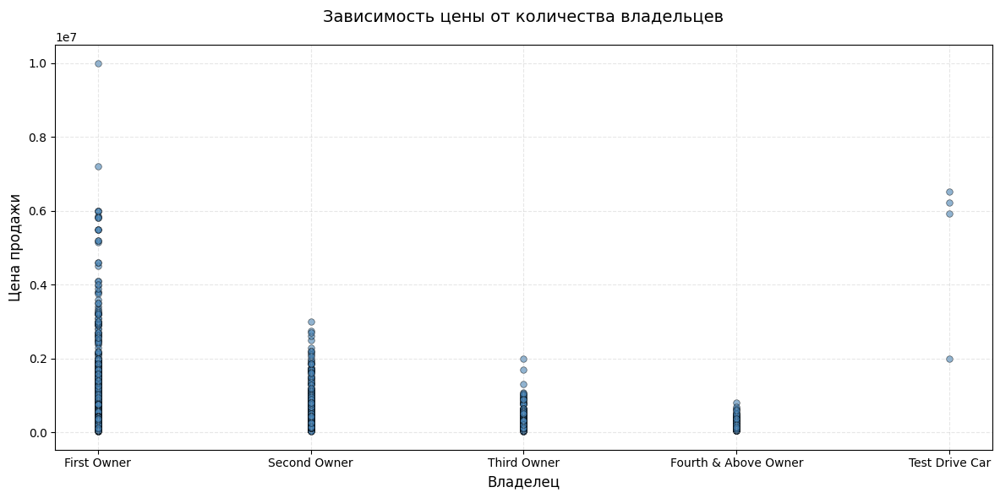

In [426]:
# Промт для DeepSeek: plt.scatter(df_train['owner'], df_train['selling_price']) сделай красиво

plt.figure(figsize=(12, 6))
plt.scatter(df_train['owner'], df_train['selling_price'], 
            alpha=0.6, s=30, color='steelblue', edgecolor='black', linewidth=0.5)

plt.xlabel('Владелец', fontsize=12)
plt.ylabel('Цена продажи', fontsize=12)
plt.title('Зависимость цены от количества владельцев', fontsize=14, pad=20)
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

__Вывод__: по графику видно, что второй владелец в наибольшей степени похож на первого владельца, за исключением выбросов, аналогично для 3-го и 4-го, поэтому их можно объединить так: 1-2 владелец, 3-4 владелец, тест-драйв вообще сам по себе как-то, его просто выбросим

In [476]:
# п. 2
def new_features(df_orig):
    df = df_orig.copy()
    df['FS_owner'] = df['owner'].isin(['First Owner', 'Second Owner']) * 1
    df['TF_owner'] = df['owner'].isin(['Third Owner', 'Fourth & Above Owner']) * 1
    df = df.drop('owner', axis=1)

    return df

df_train_cat_super = new_features(X_train_cat)
df_test_cat_super = new_features(X_test_cat)

In [477]:
# п. 3
# для начала наконец-то поработаем с выбросами, будем использовать IQR, заменять их на lower_bound и upper_bound

def get_bounds(df):
    bounds = pd.DataFrame(columns=df.columns, index=['lower_bound', 'upper_bound'])
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        bounds[column] = [lower_bound, upper_bound]
    return bounds

def fill_outliers(df_orig, bounds):
    df = df_orig.copy()
    for col in df:
        lower_bound, upper_bound = bounds[col]
        df[col] = np.where(df[col] < lower_bound, lower_bound,
                              np.where(df[col] > upper_bound, upper_bound, 
                              df[col]))
        return df

train_bounds = get_bounds(df_train_numeric_super)
df_train_numeric_super_noout = fill_outliers(df_train_numeric_super, train_bounds)
df_test_numeric_super_noout = fill_outliers(df_test_numeric_super, train_bounds)

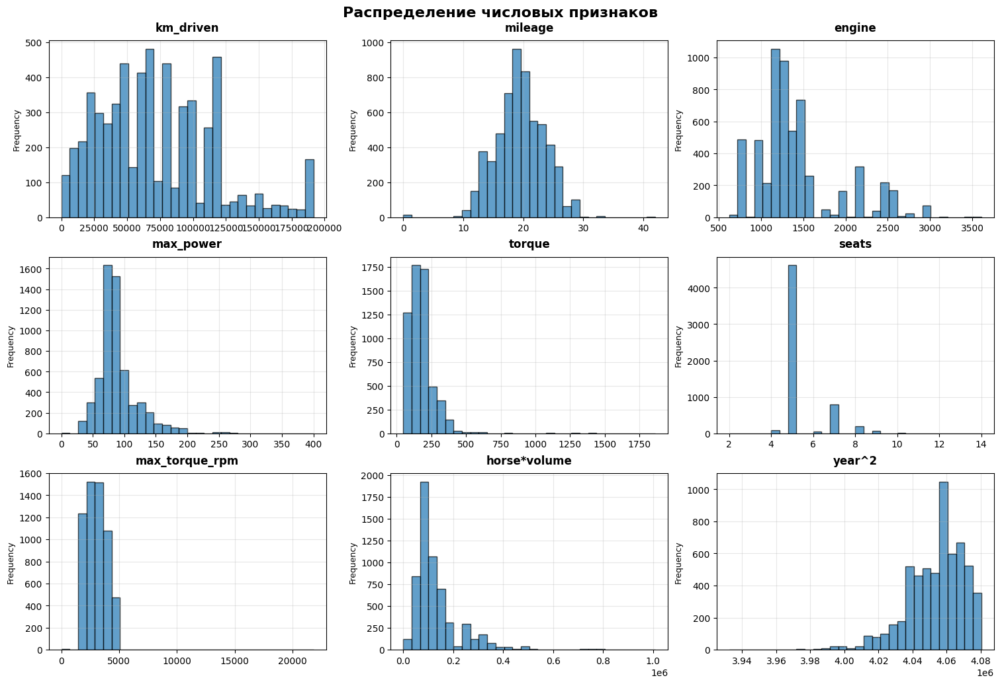

In [ ]:
# DeepSeek промт: df_train_numeric_super_noout.hist() сделай красиво

fig, axes = plt.subplots(figsize=(15, 10), nrows=3, ncols=3, constrained_layout=True)
axes = axes.flatten()

for idx, column in enumerate(df_train_numeric_super_noout.columns):
    if idx < len(axes):
        ax = axes[idx]
        df_train_numeric_super_noout[column].hist(ax=ax, bins=30, edgecolor='black', alpha=0.7)
        ax.set_title(f'{column}', fontsize=12, fontweight='bold', pad=10)
        ax.set_xlabel('')
        ax.set_ylabel('Frequency', fontsize=9)
        ax.grid(True, alpha=0.3)
        
# Скрыть пустые subplots
for idx in range(len(df_train_numeric_super_noout.columns), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Распределение числовых признаков', fontsize=16, fontweight='bold', y=1.02)
plt.show()

__Отвратительно:__ все кроме `milleage` выглядит страшно, логарифмируем все кроме `milleage` и `seats`

In [479]:
def log_col(df_orig):
    df = df_orig.copy()
    for col in ['km_driven', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'horse*volume', 'year^2']:
        df[col] = np.log(df[col]+1e-6)

    return df

df_train_numeric_super_noout_log = log_col(df_train_numeric_super_noout)
df_test_numeric_super_noout_log = log_col(df_test_numeric_super_noout)

__Окей__: теперь собъем все к нужному: категории к категориям, числа к числам

In [801]:
X_train_final_num = df_train_numeric_super_noout_log.drop('seats', axis=1)
X_test_final_num = df_test_numeric_super_noout_log.drop('seats', axis=1)

X_train_final_bool = df_train_cat_super[['FS_owner', 'TF_owner']]
X_test_final_bool = df_test_cat_super[['FS_owner', 'TF_owner']]

X_train_final_cat = df_train_cat_super.drop(['FS_owner', 'TF_owner'], axis=1).astype('str')
X_test_final_cat = df_test_cat_super.drop(['FS_owner', 'TF_owner'], axis=1).astype('str')

X_train_super = pd.concat((X_train_final_num, X_train_final_bool, X_train_final_cat), axis=1)
X_test_super = pd.concat((X_test_final_num, X_test_final_bool, X_test_final_cat), axis=1)

Построим пайплайн для этого монстра, который, скорее всего, покажет отвратительные результаты

In [802]:
categorical_columns = list(X_train_final_cat.columns)
numeric_columns = list(X_train_final_num.columns)

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numeric_columns),
    ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_columns)
])

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', Ridge(**gsRidge.best_params_))
])

pipeline.fit(X_train_super, y_train)
predFinal = pipeline.predict(X_test_super)

In [ ]:
r2_model6 = r2_score(y_test, predFinal)
mse_model6 = MSE(y_test, predFinal)
all_metrics['Final_model'] = [r2_model6, mse_model6]

,Model1,Model2,Model3,GS_Lasso,GS_EN,GS_Ridge,Final_model
R2,0.60,0.60,0.60,0.59,0.60,0.93,0.95
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72,39897937446.78,28450913580.56
business10,0.25,0.25,0.25,0.26,0.25,0.39,0.44
myBusiness,3.25,3.25,3.25,3.17,3.25,0.16,0.23


In [486]:
all_metrics

,Model1,Model2,Model3,GS_Lasso,GS_EN,GS_Ridge,Final_model
R2,0.60,0.60,0.60,0.59,0.60,0.93,0.95
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72,39897937446.78,28450913580.56


__Удивление:__ однако же! Из этого всего получилось выбить еще 2 сотые для коэффициента детерминации, MSE сократился на 11'447'023'866.2

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [525]:
def business_metrics(y_true, y_pred):
    znam = np.maximum(y_true, y_pred) + 1e-3
    chisl = np.abs(y_true - y_pred)
    errors = chisl / znam

    return np.mean(errors <= 0.1)

models_preds = {'Model1': pred1, 'Model2': pred2, 'Model3': pred3, 'GS_Lasso': pred4, 'GS_EN': pred5, 'GS_Ridge': pred6, 'Final_model': predFinal}


all_metrics.loc['business10'] = [np.nan] * len(all_metrics.columns)

for model, pred in models_preds.items():
    all_metrics.loc['business10', model] = business_metrics(y_test, pred)


all_metrics

,Model1,Model2,Model3,GS_Lasso,GS_EN,GS_Ridge,Final_model
R2,0.60,0.60,0.60,0.59,0.60,0.93,0.95
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72,39897937446.78,28450913580.56
business10,0.25,0.25,0.25,0.26,0.25,0.39,0.44


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



__Плак-плак:__ до наступления, нового дня, 2 декабря (конец дедлайна) остаются считанные минуты, тк я уже не могу придумать ничего, что потянуло бы хотя бы на уровень кандидата метричных наук, просто взвесим MSE, но в процентах, объяснить задумку тяжело, все ниже!!

In [563]:
def your_business_metrics(y_true, y_pred, alpha=0.9):
    diff = y_pred - y_true
    percent_diff = diff / y_true

    under_mask = percent_diff < 0
    over_mask = ~under_mask
    
    sq_error = percent_diff ** 2
    
    under_mse = sq_error[under_mask].mean() if under_mask.any() else 0
    over_mse  = sq_error[over_mask].mean()  if over_mask.any() else 0

    return under_mse * alpha + over_mse * (1 - alpha)

all_metrics.loc['myBusiness'] = [np.nan] * len(all_metrics.columns)

for model, pred in models_preds.items():
    all_metrics.loc['myBusiness', model] = your_business_metrics(y_test, pred)

all_metrics

,Model1,Model2,Model3,GS_Lasso,GS_EN,GS_Ridge,Final_model
R2,0.60,0.60,0.60,0.59,0.60,0.93,0.95
MSE,229962033471.11,229962033471.11,229962763439.38,233166306225.36,229962399179.72,39897937446.78,28450913580.56
business10,0.25,0.25,0.25,0.26,0.25,0.39,0.44
myBusiness,3.25,3.25,3.25,3.17,3.25,0.16,0.23


__Интерпретация:__ в реализации этой метрики лучшая модель показывает метрику ниже, например, лучше, согласно написанной на коленке метрике, оказалась Ridge модель только на категориальных признаках, неплохо справилась и последняя модель, все остальные вообще мусорные...

!![я](https://i.playground.ru/p/f2BzvFJLnUesMoplaoIaoQ.gif)

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

In [797]:
import os
import pickle

models_dir = 'app/models'
model1_dir = os.path.join(models_dir, 'model1')
model2_dir = os.path.join(models_dir, 'model2')
os.makedirs(model1_dir, exist_ok=True)
os.makedirs(model2_dir, exist_ok=True)

model_1_path = os.path.join(model1_dir, 'model1.pickle')
model1_features_path = os.path.join(model1_dir, 'model1_features.pickle')
model_1_ohe_path = os.path.join(model1_dir, 'model1_ohe.pickle')
model_1_ohe_features_path = os.path.join(model1_dir, 'model1_ohe_features.pickle')

with open(model_1_path, 'wb') as f:
    pickle.dump(gsRidge.best_estimator_, f, protocol=pickle.HIGHEST_PROTOCOL)
with open(model1_features_path, 'wb') as f:
    pickle.dump(gsRidge.best_estimator_.feature_names_in_, f, protocol=4)
with open(model_1_ohe_path, 'wb') as f:
    pickle.dump(ohe, f, protocol=4)
with open(model_1_ohe_features_path, 'wb') as f:
    pickle.dump(ohe.feature_names_in_, f, protocol=4)

In [816]:
model_2_path = os.path.join(model2_dir, 'model2.pickle')
model2_features_path = os.path.join(model2_dir, 'model2_features.pickle')
model2_IQRbounds_path = os.path.join(model2_dir, 'model2_IQRbounds.pickle')
model2_meanNumCol_path = os.path.join(model2_dir, 'model2_meanNumCol.pickle')

with open(model_2_path, 'wb') as f:
    pickle.dump(pipeline, f, protocol=pickle.HIGHEST_PROTOCOL)
with open(model2_features_path, 'wb') as f:
    pickle.dump(pipeline.feature_names_in_, f, protocol=4)
with open(model2_IQRbounds_path, 'wb') as f:
    pickle.dump(train_bounds, f, protocol=pickle.HIGHEST_PROTOCOL)
with open(model2_meanNumCol_path, 'wb') as f:
    pickle.dump(X_train_final_num.mean(), f, protocol=pickle.HIGHEST_PROTOCOL)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.


#### Сохраняем картинку весов

In [ ]:
def plot_coefficients_plotly(model, feature_names, title="Веса модели"):
    coefficients = model.coef_.flatten()
    
    df = pd.DataFrame({
        'Признак': feature_names,
        'Коэффициент': coefficients,
        'Абс_коэффициент': np.abs(coefficients),
        'Цвет': ['positive' if c >= 0 else 'negative' for c in coefficients]
    }).sort_values('Абс_коэффициент', ascending=True)
    
    fig = px.bar(df, 
                 x='Коэффициент', 
                 y='Признак',
                 color='Цвет',
                 color_discrete_map={'positive': '#2ecc71', 'negative': '#e74c3c'},
                 orientation='h',
                 title=title,
                 text=df['Коэффициент'].apply(lambda x: f'{x:.4f}'))
    
    fig.update_layout(
        showlegend=False,
        xaxis_title="Значение коэффициента",
        yaxis_title="",
        height=500 + len(feature_names) * 20,
        template="plotly_white"
    )
    
    fig.add_vline(x=0, line_width=1, line_dash="dash", line_color="black")
    
    return fig

In [843]:
fig = plot_coefficients_plotly(gsRidge.best_estimator_, gsRidge.best_estimator_.feature_names_in_)
with open('app/graphs/weights_model1.pickle', 'wb') as f:
    pickle.dump(fig, f)

In [871]:
fig = plot_coefficients_plotly(pipeline['model'], pipeline['preprocessor'].get_feature_names_out())
with open('app/graphs/weights_model2.pickle', 'wb') as f:
    pickle.dump(fig, f)